In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

## 1. Генерация шумов

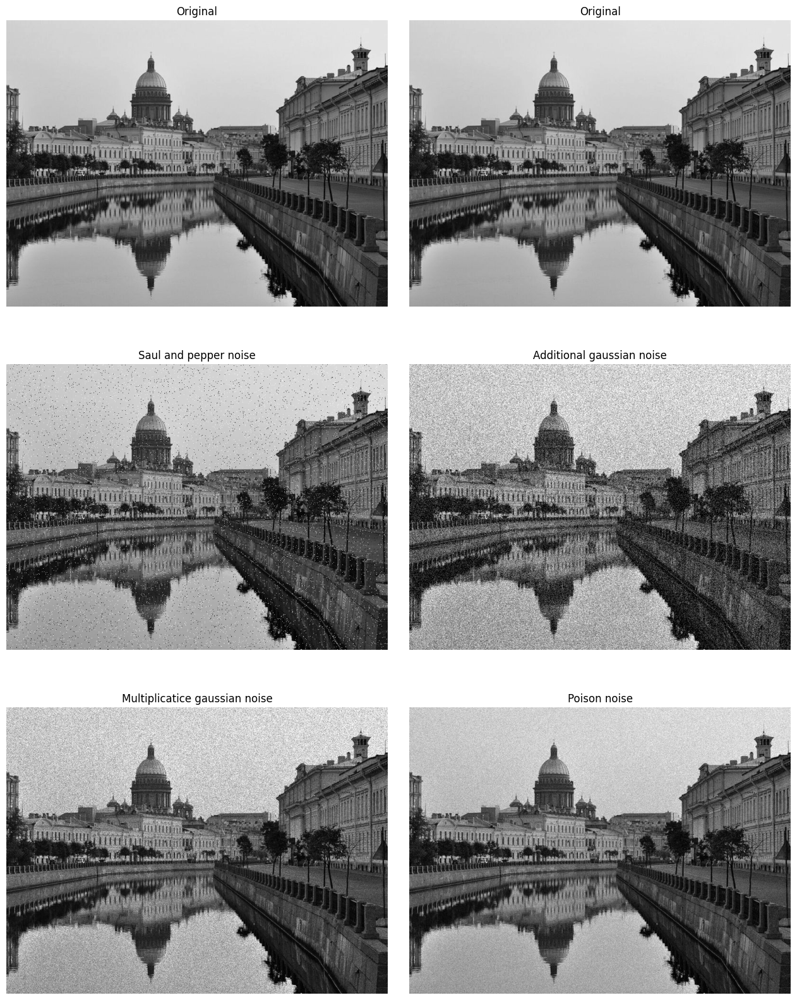

In [44]:
I = cv2.imread('spb_2.jpg', cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255  #original image
I_sp = random_noise(I, mode='s&p', amount=0.03, salt_vs_pepper=0.6).astype(np.float32)  #Image with saul and pepper noise
I_add = random_noise(I, mode='gaussian', mean=0, var=0.02).astype(np.float32)  #Image with additive gaussian noise
I_specle = random_noise(I, mode='speckle', mean=0, var=0.02).astype(np.float32) #Image with multiplicative gaussian noise
I_quant = random_noise(I, mode='poisson').astype(np.float32) #Image with quantization (poission) noise

#visualization
f, ax = plt.subplots(3,2, figsize=(20,20))
ax[0,0].imshow(I, cmap='gray')
ax[0,0].set_title('Original')
ax[0,1].imshow(I, cmap='gray')
ax[0,1].set_title('Original')
ax[1,0].imshow(I_sp, cmap='gray')
ax[1,0].set_title('Saul and pepper noise')
ax[1,1].imshow(I_add, cmap='gray')
ax[1,1].set_title('Additional gaussian noise')
ax[2,0].imshow(I_specle, cmap='gray')
ax[2,0].set_title('Multiplicatice gaussian noise')
ax[2,1].imshow(I_quant, cmap='gray')
ax[2,1].set_title('Poison noise')
ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
plt.subplots_adjust(wspace=-0.3)
plt.show()

## 2. Низкочастотная фильтрация

### 2.1 Фильтр Гаусса

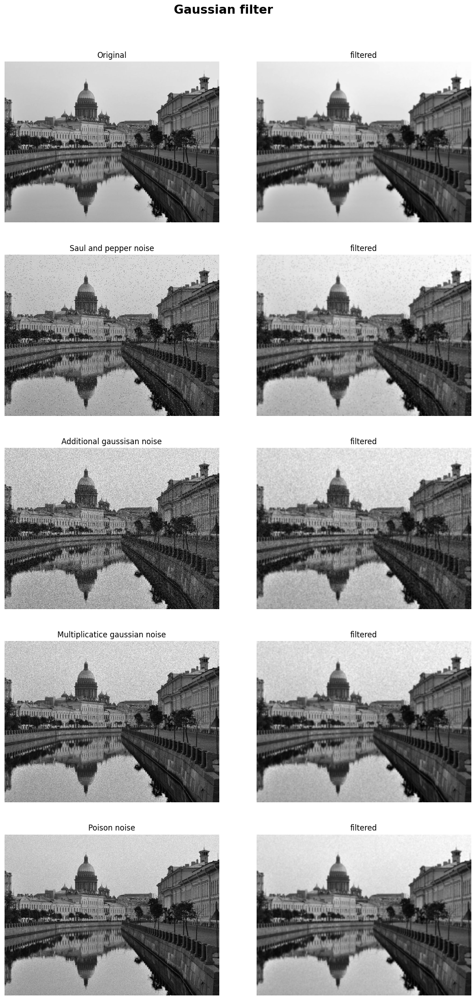

In [45]:
sigmaX = 1.5
ksize = (0, 0)
I_filter_gauss_1 = cv2.GaussianBlur(I, ksize, sigmaX)
I_filter_gauss_2 = cv2.GaussianBlur(I_sp, ksize, sigmaX)
I_filter_gauss_3 = cv2.GaussianBlur(I_add, ksize, sigmaX)
I_filter_gauss_4 = cv2.GaussianBlur(I_specle, ksize, sigmaX)
I_filter_gauss_5 = cv2.GaussianBlur(I_quant, ksize, sigmaX)

#visualization
f, ax = plt.subplots(5,2, figsize=(25,25))
f.suptitle('Gaussian filter', fontsize=19, ha='center', fontweight='bold')
ax[0,0].imshow(I, cmap='gray')
ax[0,0].set_title('Original')
ax[0,1].imshow(I_filter_gauss_1, cmap='gray')
ax[0,1].set_title('filtered')

ax[1,0].imshow(I_sp, cmap='gray')
ax[1,0].set_title('Saul and pepper noise')
ax[1,1].imshow(I_filter_gauss_2, cmap='gray')
ax[1,1].set_title('filtered')

ax[2,0].imshow(I_add, cmap='gray')
ax[2,0].set_title('Additional gaussisan noise')
ax[2,1].imshow(I_filter_gauss_3, cmap='gray')
ax[2,1].set_title('filtered')

ax[3,0].imshow(I_specle, cmap='gray')
ax[3,0].set_title('Multiplicatice gaussian noise')
ax[3,1].imshow(I_filter_gauss_4, cmap='gray')
ax[3,1].set_title('filtered')

ax[4,0].imshow(I_quant, cmap='gray')
ax[4,0].set_title('Poison noise')
ax[4,1].imshow(I_filter_gauss_5, cmap='gray')
ax[4,1].set_title('filtered')

ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
ax[3,0].axis('off') 
ax[3,1].axis('off') 
ax[4,0].axis('off') 
ax[4,1].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.6)
plt.show()

### 2.2 Контргармонический фильтр

In [46]:
def Contrgarmonic_filter(I, Q, ksize):
    eps = 1e-10
    I_Q = (I + eps) ** Q
    kernel = np.ones(ksize, dtype=np.float32)
    numerator = cv2.filter2D(I_Q * I, -1, kernel)
    demoninator = cv2.filter2D(I_Q, -1, kernel) + eps
    return np.clip((numerator / demoninator).astype(np.float32), 0, 1)

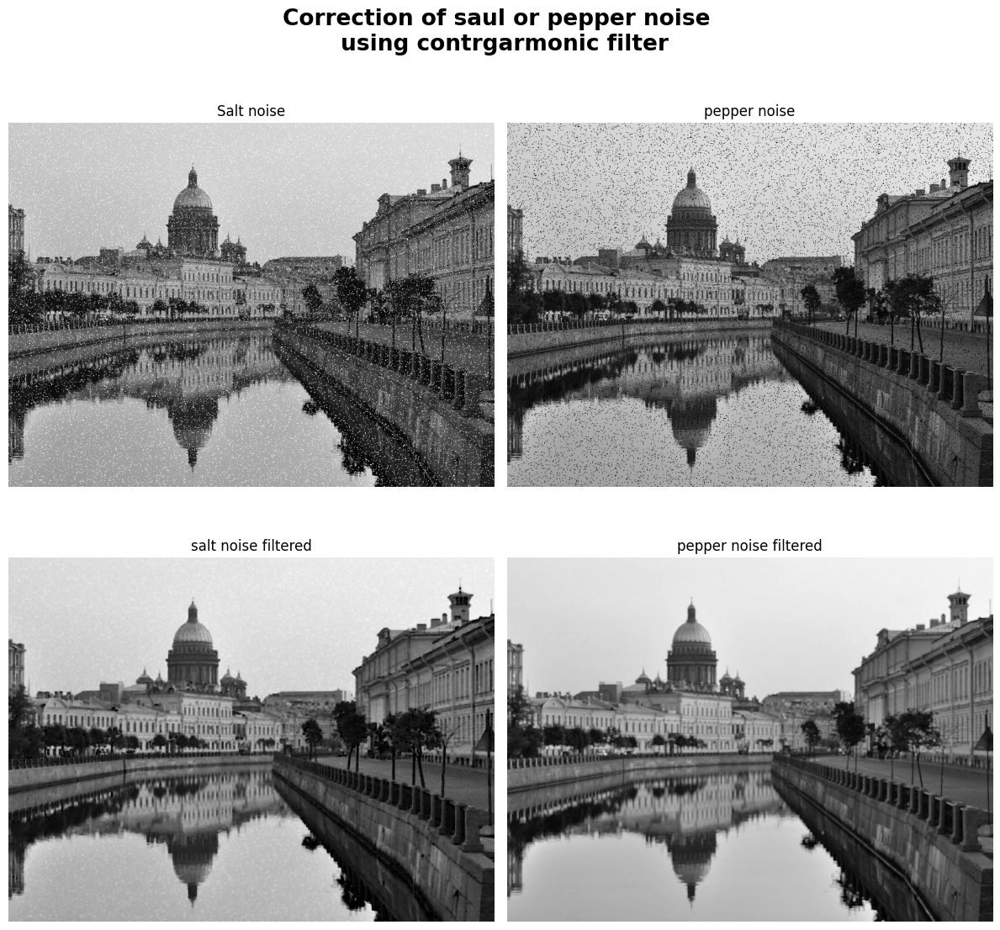

In [47]:
I_salt = random_noise(I, mode='salt')
I_pepper = random_noise(I, mode='pepper')
I_pepper_filter = Contrgarmonic_filter(I_pepper, Q=1.5, ksize=(3,3))
I_salt_filter = Contrgarmonic_filter(I_salt, Q=-1.5, ksize=(3,3))

f, ax = plt.subplots(2,2, figsize=(12,12))
f.suptitle('Correction of saul or pepper noise \n using contrgarmonic filter', ha='center',
            fontsize=19, fontweight='bold')
ax[0,0].imshow(I_salt, cmap='gray')
ax[0,0].set_title('Salt noise')

ax[1,0].imshow(I_salt_filter, cmap='gray')
ax[1,0].set_title('salt noise filtered')

ax[0,1].imshow(I_pepper, cmap='gray')
ax[0,1].set_title('pepper noise')

ax[1,1].imshow(I_pepper_filter, cmap='gray')
ax[1,1].set_title('pepper noise filtered')


ax[0,0].axis('off') 
ax[1,0].axis('off') 
ax[0,1].axis('off') 
ax[1,1].axis('off') 
plt.tight_layout()
plt.show()

## 3. Нелинейная фильтрация

### 3.1 Медианный фильтр

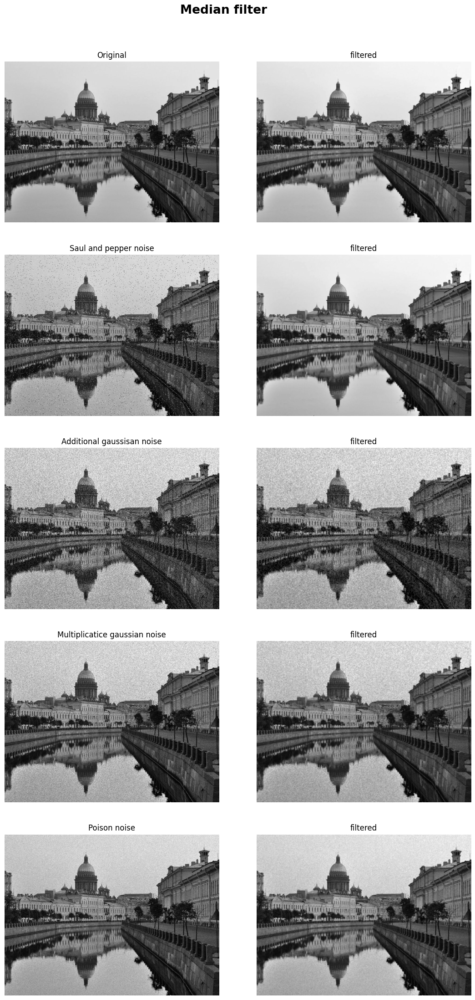

In [48]:
ksize = 3
I_filter_m_1 = cv2.medianBlur(I, ksize)
I_filter_m_2 = cv2.medianBlur(I_sp, ksize)
I_filter_m_3 = cv2.medianBlur(I_add, ksize)
I_filter_m_4 = cv2.medianBlur(I_specle, ksize)
I_filter_m_5 = cv2.medianBlur(I_quant, ksize)

#visualization
f, ax = plt.subplots(5,2, figsize=(25,25))
f.suptitle('Median filter', fontsize=19, ha='center', fontweight='bold')
ax[0,0].imshow(I, cmap='gray')
ax[0,0].set_title('Original')
ax[0,1].imshow(I_filter_m_1, cmap='gray')
ax[0,1].set_title('filtered')

ax[1,0].imshow(I_sp, cmap='gray')
ax[1,0].set_title('Saul and pepper noise')
ax[1,1].imshow(I_filter_m_2, cmap='gray')
ax[1,1].set_title('filtered')

ax[2,0].imshow(I_add, cmap='gray')
ax[2,0].set_title('Additional gaussisan noise')
ax[2,1].imshow(I_filter_m_3, cmap='gray')
ax[2,1].set_title('filtered')

ax[3,0].imshow(I_specle, cmap='gray')
ax[3,0].set_title('Multiplicatice gaussian noise')
ax[3,1].imshow(I_filter_m_4, cmap='gray')
ax[3,1].set_title('filtered')

ax[4,0].imshow(I_quant, cmap='gray')
ax[4,0].set_title('Poison noise')
ax[4,1].imshow(I_filter_m_5, cmap='gray')
ax[4,1].set_title('filtered')

ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
ax[3,0].axis('off') 
ax[3,1].axis('off') 
ax[4,0].axis('off') 
ax[4,1].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.6)
plt.show()

### 3.2 Взвешенный медианный фильтр, ранговый фильтр

In [49]:
# взвешенный медианный фильтр - расширение медианного фильтра
# ранговый фильтр - обобщение медианного фильтра. 
def weight_rank_filter(I, k_size, kernel, rank):  
    I_out = np.copy(I)
    I_copy = cv2.copyMakeBorder(I, int((k_size[0] - 1) / 2), int(k_size[0] / 2),
                                    int((k_size[1] - 1) / 2), int(k_size[1] / 2), cv2.BORDER_REPLICATE)
    rows, cols = I_copy.shape[0:2]
    kernel_fl = kernel.flatten()
    index_center_kernel = (k_size[0] // 2, k_size[1] // 2)
    for i in range(index_center_kernel[0], rows - index_center_kernel[0]):
        for j in range(index_center_kernel[1], cols - index_center_kernel[1]):
            window = I_copy[i-index_center_kernel[0]:i+index_center_kernel[0]+1,
                            j-index_center_kernel[1]:j+index_center_kernel[1]+1].flatten()
            pixels = np.sort(np.repeat(window, kernel_fl))
            I_out[i-index_center_kernel[0], j-index_center_kernel[1]] = pixels[rank]
    return I_out

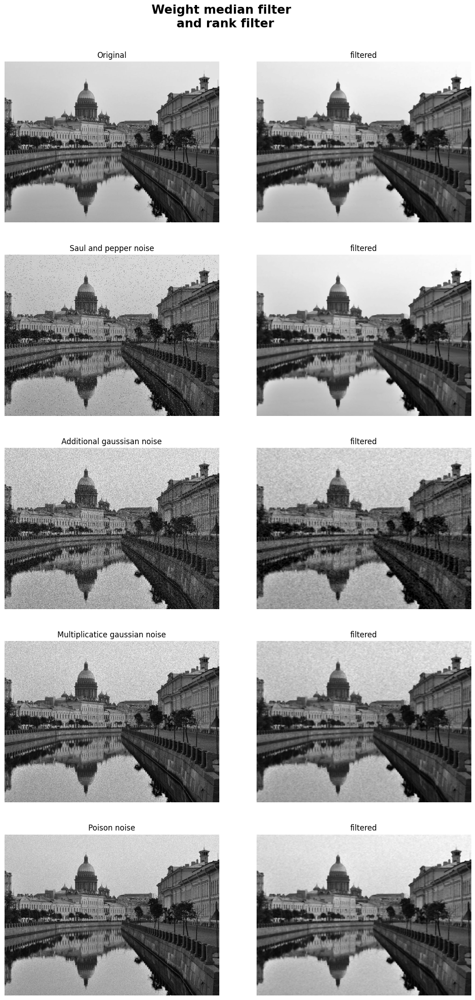

In [50]:
k_size = (5,7) #размер маски для медианы
kernel = np.array([[1,1,1,1,1,1,1],[1,1,2,2,2,1,1],
                   [1,2,3,4,3,2,1],[1,1,2,2,2,1,1],[1,1,1,1,1,1,1]], 
                   dtype=np.int64)  #матрица весов для медианного фильтра 5x7
rank = 20  # ранг рангового фильтра

I_filter_m_1 = weight_rank_filter(I, k_size, kernel, rank)
I_filter_m_2 = weight_rank_filter(I_sp, k_size, kernel, rank)
I_filter_m_3 = weight_rank_filter(I_add, k_size, kernel, rank)
I_filter_m_4 = weight_rank_filter(I_specle, k_size, kernel, rank)
I_filter_m_5 = weight_rank_filter(I_quant, k_size, kernel, rank)

#visualization
f, ax = plt.subplots(5,2, figsize=(25,25))
f.suptitle('Weight median filter \n and rank filter', fontsize=19, ha='center', fontweight='bold')
ax[0,0].imshow(I, cmap='gray')
ax[0,0].set_title('Original')
ax[0,1].imshow(I_filter_m_1, cmap='gray')
ax[0,1].set_title('filtered')

ax[1,0].imshow(I_sp, cmap='gray')
ax[1,0].set_title('Saul and pepper noise')
ax[1,1].imshow(I_filter_m_2, cmap='gray')
ax[1,1].set_title('filtered')

ax[2,0].imshow(I_add, cmap='gray')
ax[2,0].set_title('Additional gaussisan noise')
ax[2,1].imshow(I_filter_m_3, cmap='gray')
ax[2,1].set_title('filtered')

ax[3,0].imshow(I_specle, cmap='gray')
ax[3,0].set_title('Multiplicatice gaussian noise')
ax[3,1].imshow(I_filter_m_4, cmap='gray')
ax[3,1].set_title('filtered')

ax[4,0].imshow(I_quant, cmap='gray')
ax[4,0].set_title('Poison noise')
ax[4,1].imshow(I_filter_m_5, cmap='gray')
ax[4,1].set_title('filtered')

ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
ax[3,0].axis('off') 
ax[3,1].axis('off') 
ax[4,0].axis('off') 
ax[4,1].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.6)
plt.show()

### 3.3 Адаптивный медианный фильтр

In [51]:
def adaptive_median_filter(I, s_max):  
    I_out = np.copy(I)
    I_copy = cv2.copyMakeBorder(I, 1, 1, 1, 1, cv2.BORDER_REPLICATE) #border padding = 1
    rows, cols = I_copy.shape[0:2]
    for i in range(1, rows - 1):     
        for j in range(1, cols - 1):   #проход по изобр. с паддингом, поэтому обход не по всему изображению
            # шаг 1
            for s in range(3, s_max+1, 2): #цикл по размеру фильтра
                index_center_kernel = (s // 2, s // 2) #кордината центра фильтра
                # выходим из цикла подбора размера фильтра, 
                # если фильтр не может увеличиваться из-за достижения края картинки
                if (i - index_center_kernel[0]) < 0 or (j-index_center_kernel[1]) < 0:    
                    break
                window = I_copy[i-index_center_kernel[0]:i+index_center_kernel[0]+1,
                                j-index_center_kernel[1]:j+index_center_kernel[1]+1]
                z_min = window.min()
                z_max = window.max()
                z_med = np.median(window)
                A_1 = z_med - z_min
                A_2 = z_med - z_max 
                #выходим из цикла подбора размера фильтра, если достигнуто необх. условие 
                if (A_1 > 0 and A_2 < 0)  < 0:  
                    break
                # если все плохо и мы не вышли из цикла, s=s_max - не меняем текущий пиксель
                if s == s_max:
                    I_out[i-index_center_kernel[0], j-index_center_kernel[1]] = I_copy[i, j]
            # шаг 2
            B_1 = I_copy[i, j] - z_min
            B_2 = I_copy[i, j] - z_max
            if B_1 > 0 and B_2 < 0:  
                I_out[i-index_center_kernel[0], j-index_center_kernel[1]] = I_copy[i, j]
            else:
                I_out[i-index_center_kernel[0], j-index_center_kernel[1]] = z_med
    return I_out

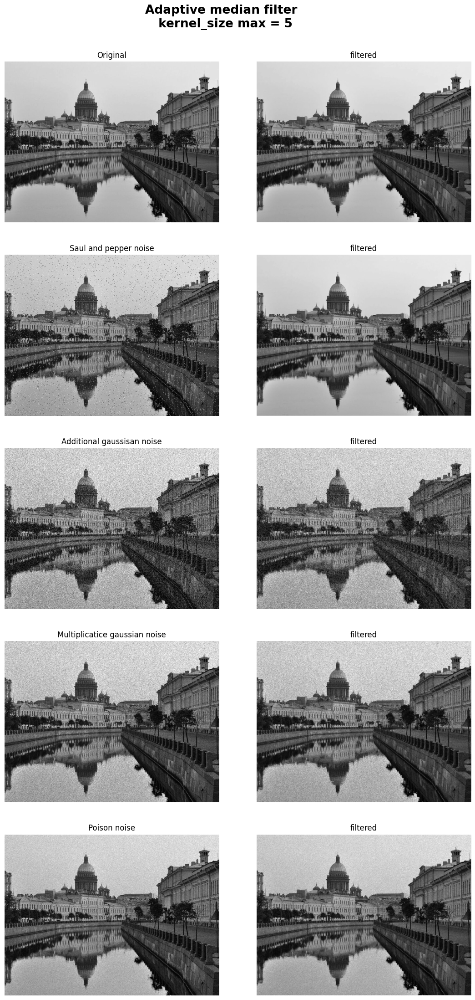

In [52]:
s_max = 5

I_filter_am_1 = adaptive_median_filter(I, s_max)
I_filter_am_2 = adaptive_median_filter(I_sp, s_max)
I_filter_am_3 = adaptive_median_filter(I_add, s_max)
I_filter_am_4 = adaptive_median_filter(I_specle, s_max)
I_filter_am_5 = adaptive_median_filter(I_quant, s_max)

#visualization
f, ax = plt.subplots(5,2, figsize=(25,25))
f.suptitle(f'Adaptive median filter \n kernel_size max = {s_max}', fontsize=19, ha='center', fontweight='bold')
ax[0,0].imshow(I, cmap='gray')
ax[0,0].set_title('Original')
ax[0,1].imshow(I_filter_am_1, cmap='gray')
ax[0,1].set_title('filtered')

ax[1,0].imshow(I_sp, cmap='gray')
ax[1,0].set_title('Saul and pepper noise')
ax[1,1].imshow(I_filter_am_2, cmap='gray')
ax[1,1].set_title('filtered')

ax[2,0].imshow(I_add, cmap='gray')
ax[2,0].set_title('Additional gaussisan noise')
ax[2,1].imshow(I_filter_am_3, cmap='gray')
ax[2,1].set_title('filtered')

ax[3,0].imshow(I_specle, cmap='gray')
ax[3,0].set_title('Multiplicatice gaussian noise')
ax[3,1].imshow(I_filter_am_4, cmap='gray')
ax[3,1].set_title('filtered')

ax[4,0].imshow(I_quant, cmap='gray')
ax[4,0].set_title('Poison noise')
ax[4,1].imshow(I_filter_am_5, cmap='gray')
ax[4,1].set_title('filtered')

ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
ax[3,0].axis('off') 
ax[3,1].axis('off') 
ax[4,0].axis('off') 
ax[4,1].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.6)
plt.show()

### 3.4 Фильтр Винера

In [53]:
def wiener_filter(I, k_size, var_noise):  
    eps = 1e-11
    I_out = np.copy(I)
    I_copy = cv2.copyMakeBorder(I, int((k_size[0] - 1) / 2), int(k_size[0] / 2),
                                    int((k_size[1] - 1) / 2), int(k_size[1] / 2), cv2.BORDER_REPLICATE)
    I_copy_power = I_copy ** 2
    
    rows, cols = I_copy.shape[0:2]
    index_center_kernel = (k_size[0] // 2, k_size[1] // 2)
    for i in range(index_center_kernel[0], rows - index_center_kernel[0]):
        for j in range(index_center_kernel[1], cols - index_center_kernel[1]):
            window = I_copy[i-index_center_kernel[0]:i+index_center_kernel[0]+1,
                            j-index_center_kernel[1]:j+index_center_kernel[1]+1]
            window_power = I_copy_power[i-index_center_kernel[0]:i+index_center_kernel[0]+1,
                            j-index_center_kernel[1]:j+index_center_kernel[1]+1]
            m = np.sum(window) / (k_size[0] * k_size[1])
            var = np.sum(window_power - m ** 2) / (k_size[0] * k_size[1])
            I_out[i-index_center_kernel[0], j-index_center_kernel[1]] = m + ((var - var_noise) / (var+eps)) * (I_copy[i,j] - m)
    return np.clip(I_out, 0, 1).astype(np.float32)

In [54]:
k_size = (5, 5)
var_noise = 0.02  #такая же дисперсия модели шума, как и при генерации шумов аддитивный и мультипликативный по Гауссу

I_filter_w_2 = wiener_filter(I_sp, k_size, var_noise)
I_filter_w_3 = wiener_filter(I_add, k_size, var_noise)
I_filter_w_4 = wiener_filter(I_specle, k_size, var_noise)
I_filter_w_5 = wiener_filter(I_quant, k_size, var_noise)


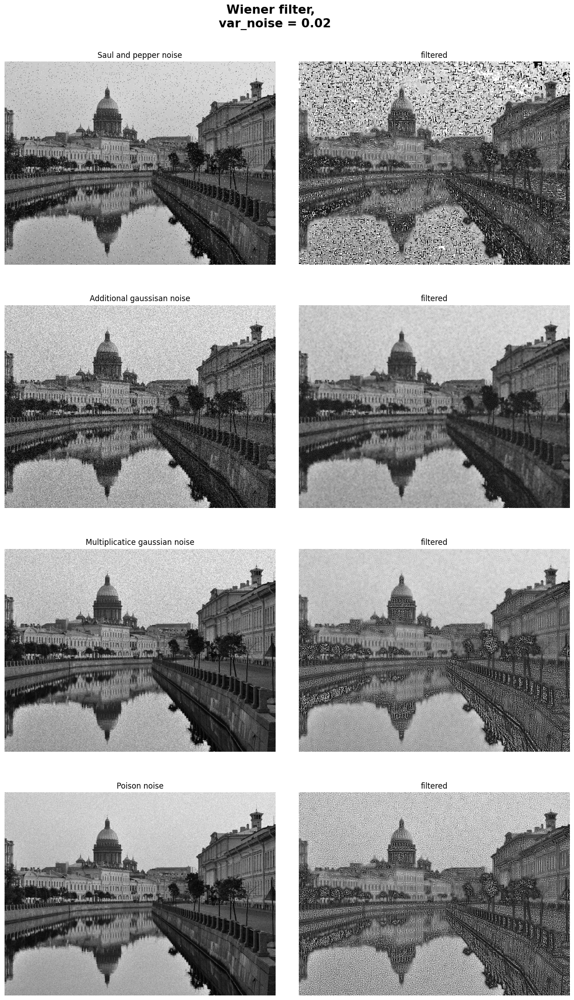

In [55]:
#visualization
f, ax = plt.subplots(4,2, figsize=(25,25))
f.suptitle(f'Wiener filter, \n var_noise = {var_noise}', fontsize=19, ha='center', fontweight='bold')

ax[0,0].imshow(I_sp, cmap='gray')
ax[0,0].set_title('Saul and pepper noise')
ax[0,1].imshow(I_filter_w_2, cmap='gray')
ax[0,1].set_title('filtered')

ax[1,0].imshow(I_add, cmap='gray')
ax[1,0].set_title('Additional gaussisan noise')
ax[1,1].imshow(I_filter_w_3, cmap='gray')
ax[1,1].set_title('filtered')

ax[2,0].imshow(I_specle, cmap='gray')
ax[2,0].set_title('Multiplicatice gaussian noise')
ax[2,1].imshow(I_filter_w_4, cmap='gray')
ax[2,1].set_title('filtered')

ax[3,0].imshow(I_quant, cmap='gray')
ax[3,0].set_title('Poison noise')
ax[3,1].imshow(I_filter_w_5, cmap='gray')
ax[3,1].set_title('filtered')

ax[0,0].axis('off') 
ax[0,1].axis('off') 
ax[1,0].axis('off') 
ax[1,1].axis('off') 
ax[2,0].axis('off') 
ax[2,1].axis('off') 
ax[3,0].axis('off') 
ax[3,1].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.5)
plt.show()

## 4. Высокочастотная фильтрация

In [63]:
Gx = np.array([[1, 0], [0, -1]])
Gy = np.array([[0, 1], [-1, 0]])
I_x = cv2.filter2D(I, -1, Gx)
I_y = cv2.filter2D(I, -1, Gy)
I_roberts = cv2.magnitude(I_x, I_y)

sobelx = cv2.Sobel(I, -1, 1, 0)
sobely = cv2.Sobel(I, -1, 0, 1)
I_sobel = cv2.magnitude(sobelx, sobely)

I_laplacian = np.absolute(cv2.Laplacian(I, -1))

Gx = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
Gx = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
I_x = cv2.filter2D(I, -1, Gx)
I_y = cv2.filter2D(I, -1, Gy)
I_previtt = cv2.magnitude(I_x, I_y)

I_int = np.round(255 * I, 0).astype(np.uint8)
I_canny = cv2.Canny(I_int, 90, 200)


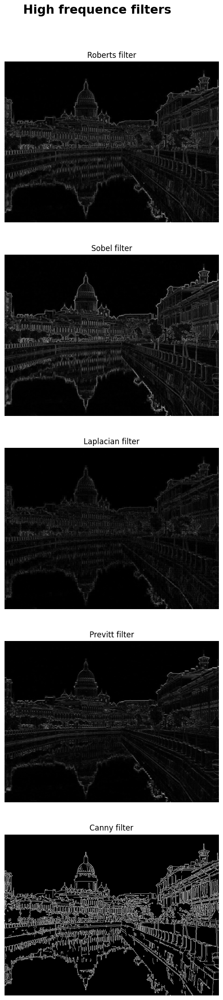

In [64]:
#visualization
f, ax = plt.subplots(5,1, figsize=(25,25))
f.suptitle('High frequence filters', fontsize=19, ha='center', fontweight='bold')

ax[0].imshow(I_roberts, cmap='gray')
ax[0].set_title('Roberts filter')

ax[1].imshow(I_sobel, cmap='gray')
ax[1].set_title('Sobel filter')

ax[2].imshow(I_laplacian, cmap='gray')
ax[2].set_title('Laplacian filter')

ax[3].imshow(I_previtt, cmap='gray')
ax[3].set_title('Previtt filter')

ax[4].imshow(I_canny, cmap='gray')
ax[4].set_title('Canny filter')

ax[0].axis('off') 
ax[1].axis('off') 
ax[2].axis('off') 
ax[3].axis('off') 
ax[4].axis('off') 
plt.subplots_adjust(top = 0.93, wspace=-0.5)
plt.show()